In [57]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
import sklearn

import scipy
from sklearn.metrics import classification_report,accuracy_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.preprocessing import LabelEncoder
from pylab import rcParams
rcParams['figure.figsize'] = 14, 8
RANDOM_SEED = 42

In [72]:


data=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Customer Conversion Prediction - Customer Conversion Prediction.csv")
data

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no
1,44,technician,single,secondary,unknown,5,may,151,1,unknown,no
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no
4,33,unknown,single,unknown,unknown,5,may,198,1,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,cellular,17,nov,977,3,unknown,yes
45207,71,retired,divorced,primary,cellular,17,nov,456,2,unknown,yes
45208,72,retired,married,secondary,cellular,17,nov,1127,5,success,yes
45209,57,blue-collar,married,secondary,telephone,17,nov,508,4,unknown,no


In [59]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45211 non-null  int64 
 1   job             45211 non-null  object
 2   marital         45211 non-null  object
 3   education_qual  45211 non-null  object
 4   call_type       45211 non-null  object
 5   day             45211 non-null  int64 
 6   mon             45211 non-null  object
 7   dur             45211 non-null  int64 
 8   num_calls       45211 non-null  int64 
 9   prev_outcome    45211 non-null  object
 10  y               45211 non-null  object
dtypes: int64(4), object(7)
memory usage: 3.8+ MB


#DATA VISULALIZATION DONE IN POWERBI

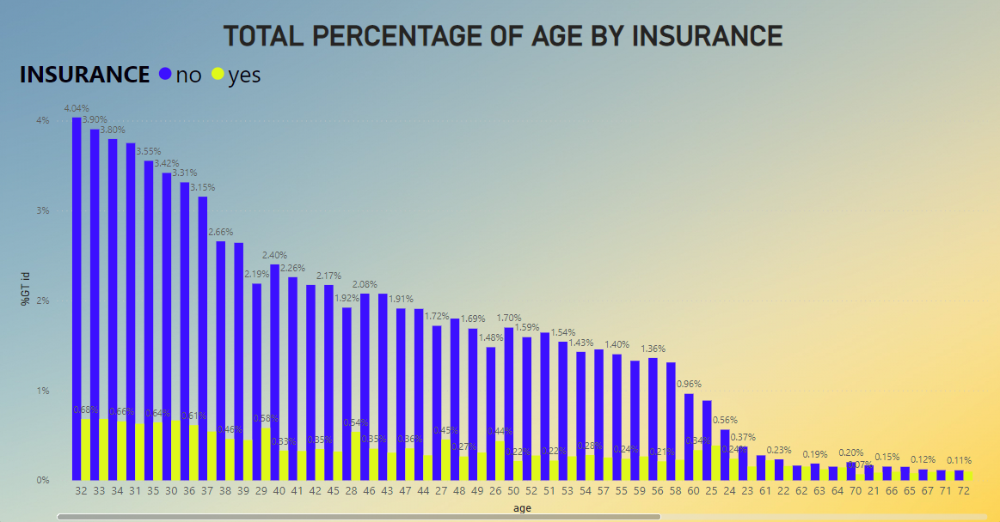

In [5]:
from PIL import Image

im=Image.open("/content/Screenshot 2022-07-18 080353.png")
im



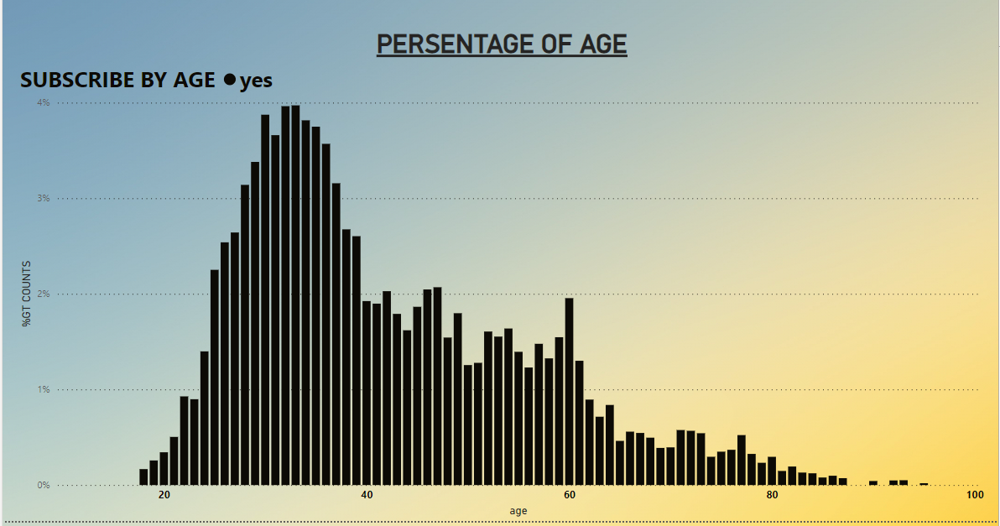

In [7]:
im=Image.open("/content/Screenshot 2022-07-18 084446.png")
im

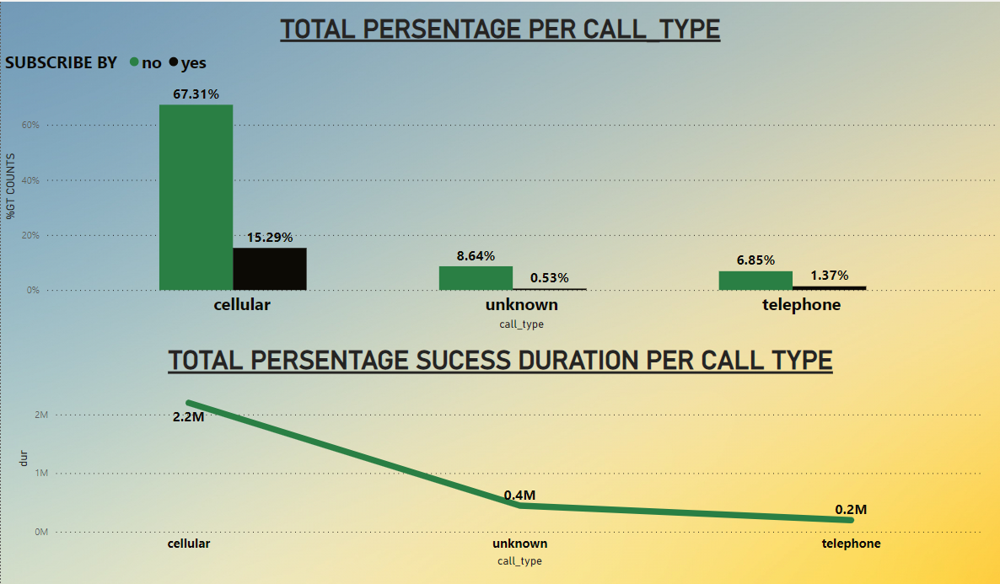

In [9]:
im=Image.open("/content/Screenshot 2022-07-18 105413.png")
im

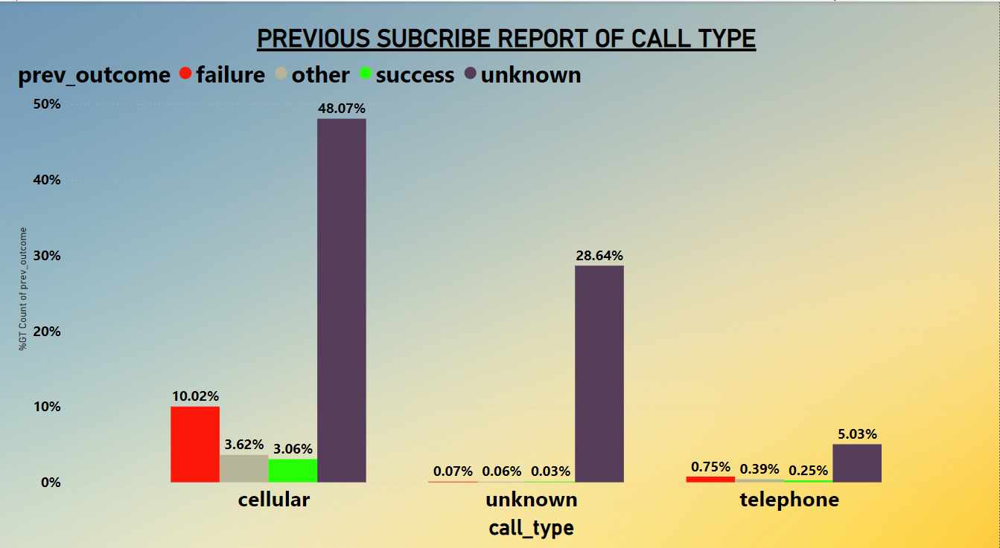

In [11]:
im=Image.open("/content/Screenshot 2022-07-19 012012.png")
im

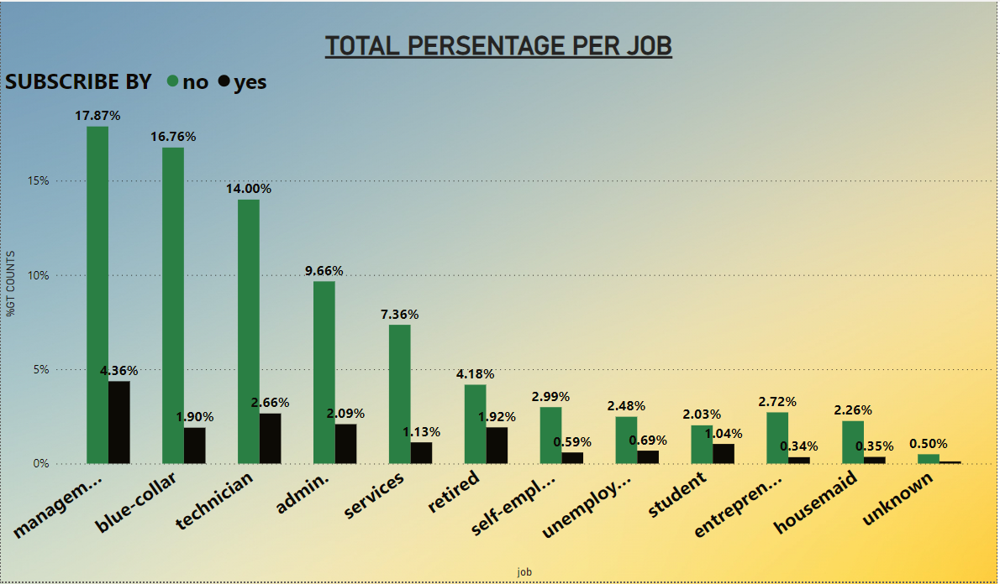

In [13]:
im=Image.open("/content/Screenshot 2022-07-18 235659.png")
im

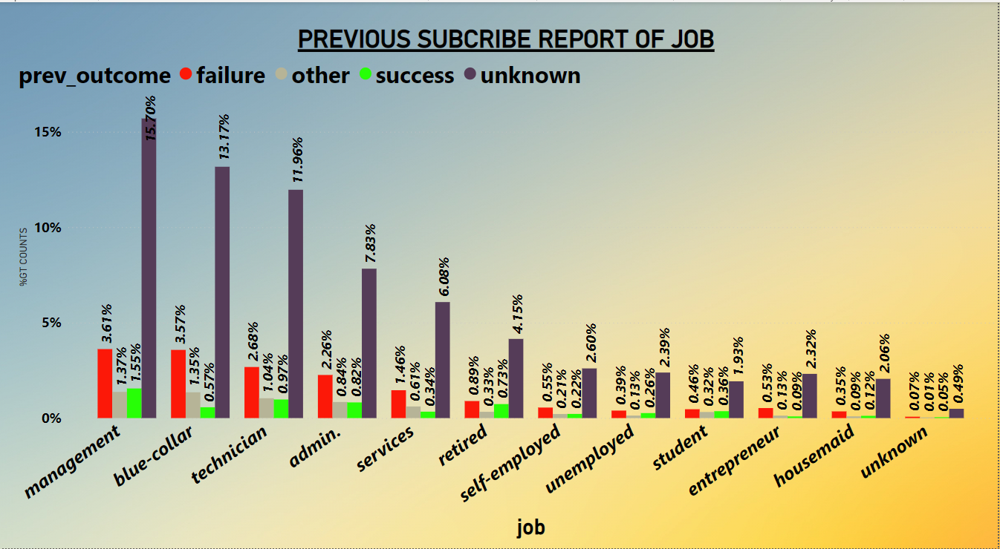

In [14]:
im=Image.open("/content/Screenshot 2022-07-19 014039.png")
im

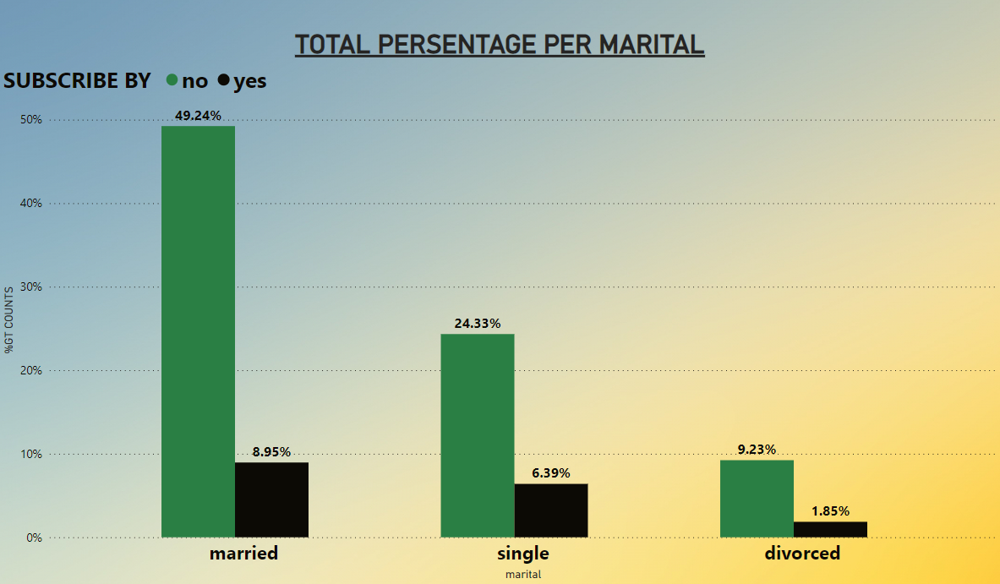

In [15]:
im=Image.open("/content/Screenshot 2022-07-18 235910.png")
im

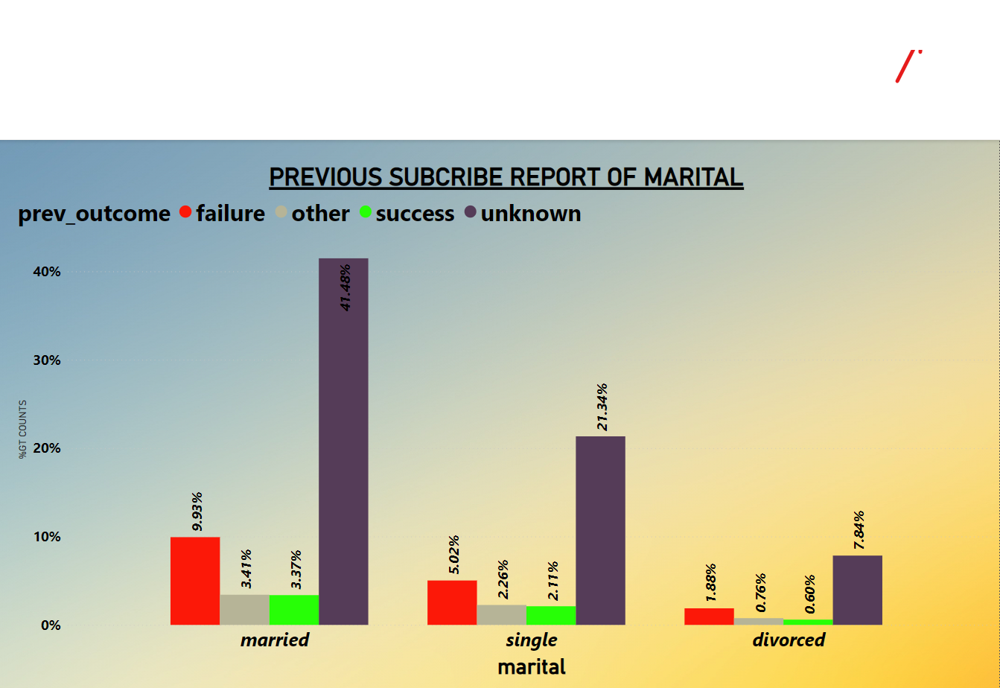

In [16]:

im=Image.open("/content/Screenshot 2022-07-19 014311.png")
im

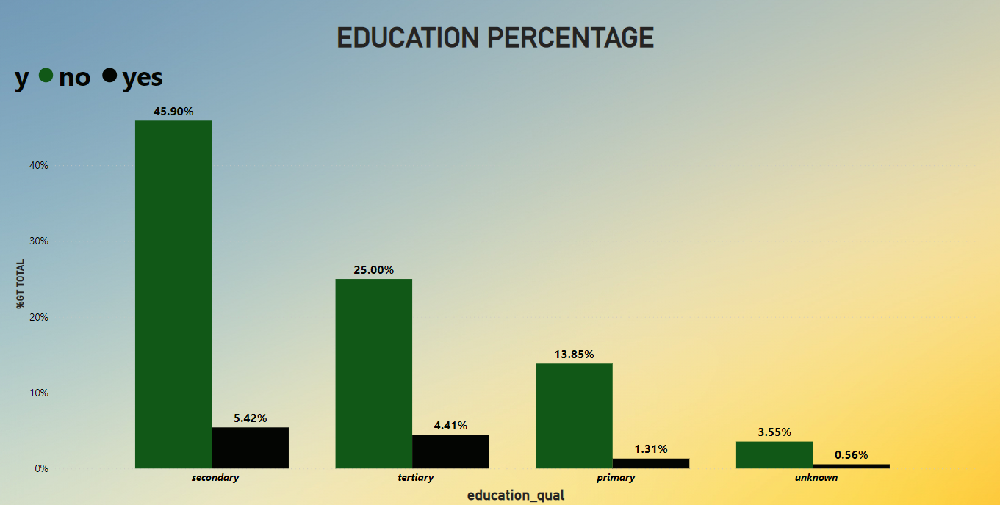

In [18]:
im=Image.open("/content/Screenshot 2022-07-19 083725.png")
im

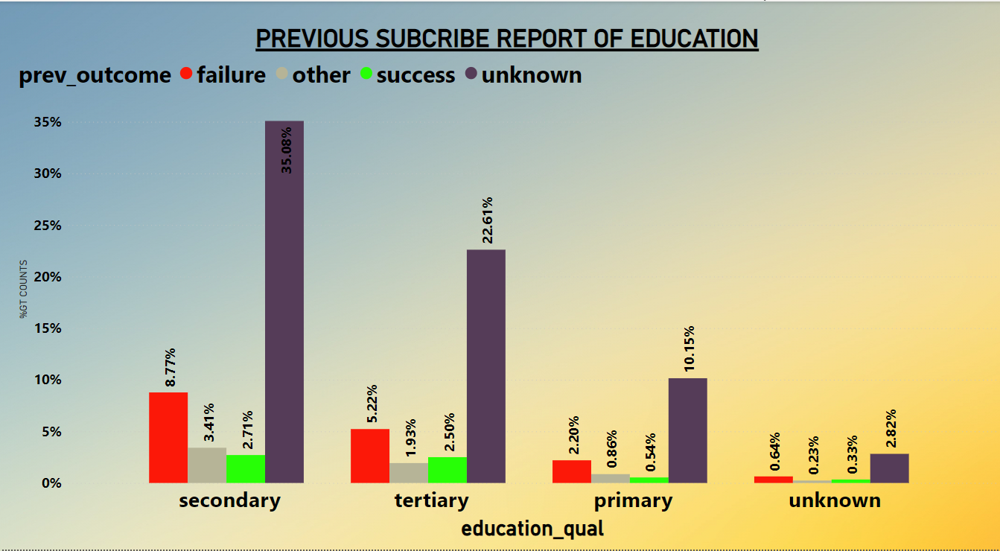

In [17]:
im=Image.open("/content/Screenshot 2022-07-19 013607.png")
im

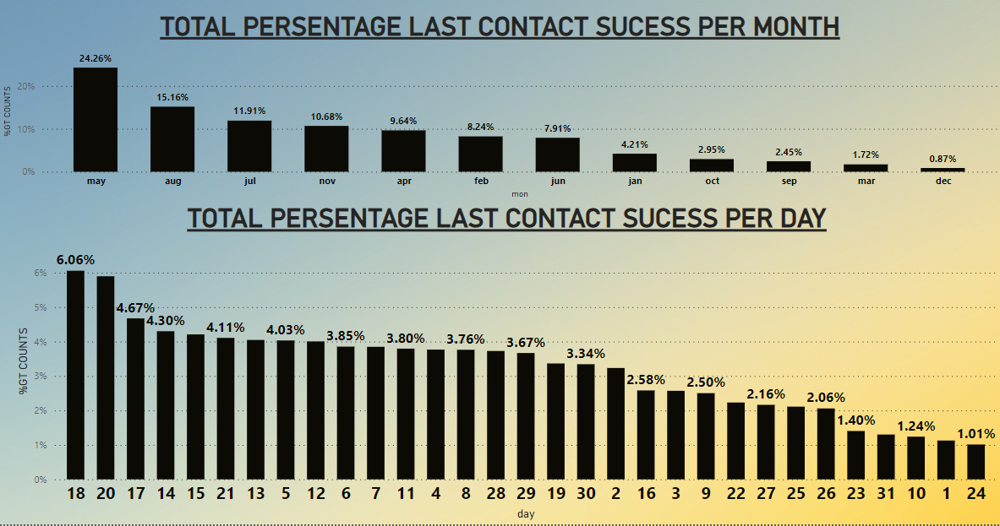

In [10]:
im=Image.open("/content/Screenshot 2022-07-18 093725.png")
im

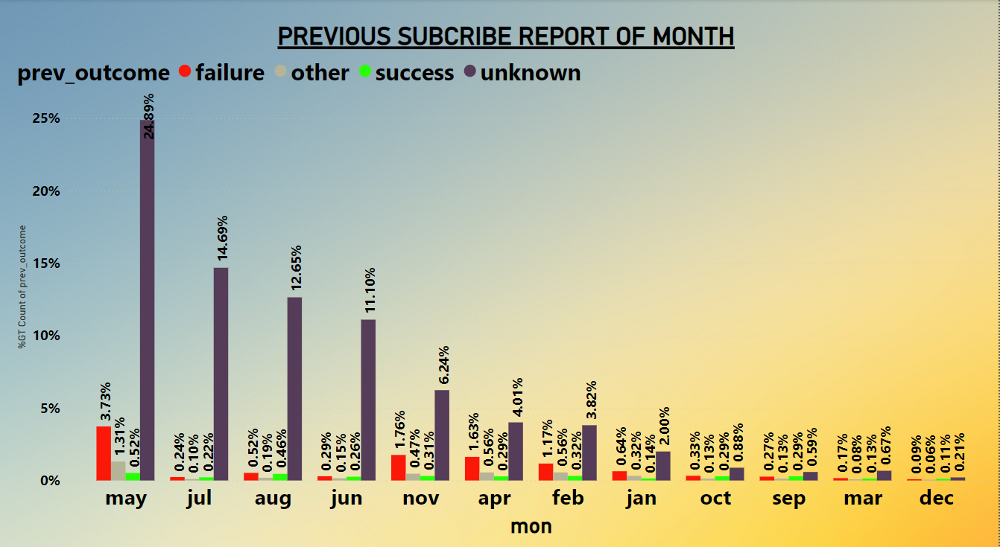

In [12]:
im=Image.open("/content/Screenshot 2022-07-19 012622.png")
im

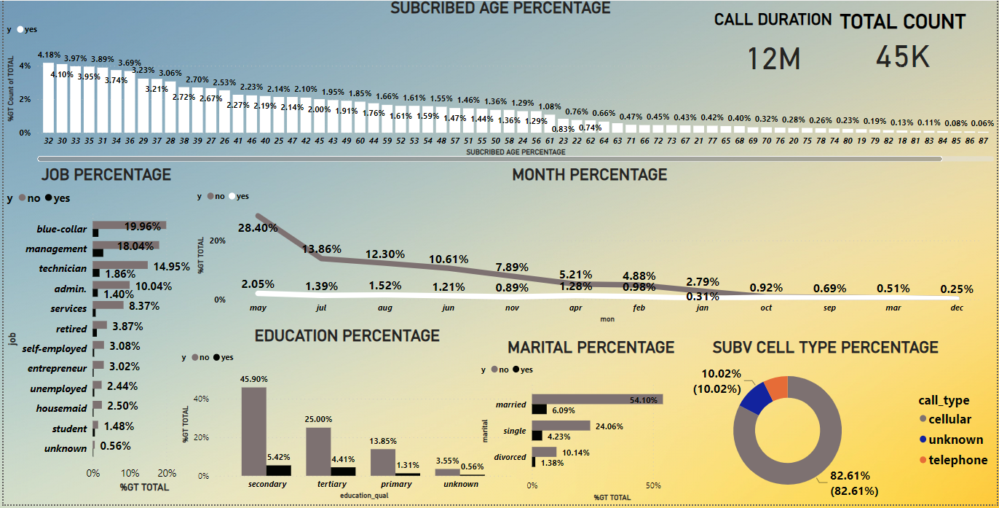

In [19]:
im=Image.open("/content/INSURENCE PREDICTION_POWERBI.png")
im

#Mechine learning

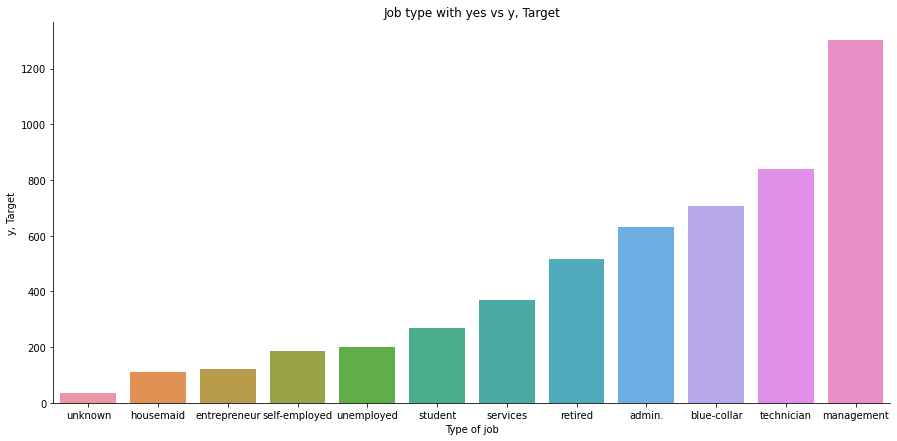

In [24]:
yes=data[data.y=="yes"]
plt.figure(figsize = (15, 7))
sns.countplot(data = yes, x = 'job',
              order = yes['job'].value_counts(ascending = True).index)
plt.xlabel('Type of job')
plt.ylabel('y, Target')
plt.title('Job type with yes vs y, Target')
sns.despine()

In [74]:
data.job.unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

In [75]:
data['job'] = data['job'].map({'management':11, 'technician':10, 'blue-collar':9, 'admin.':8, 'retired': 7,"services":6,"student":5,"unemployed":4,
                               "self-employed":3,
                               "entrepreneur":2,"housemaid":1,"unknown":0})

In [76]:
matl=pd.get_dummies(data["marital"])
data=pd.concat([data,matl],axis=1)
data

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,divorced,married,single
0,58,11,married,tertiary,unknown,5,may,261,1,unknown,no,0,1,0
1,44,10,single,secondary,unknown,5,may,151,1,unknown,no,0,0,1
2,33,2,married,secondary,unknown,5,may,76,1,unknown,no,0,1,0
3,47,9,married,unknown,unknown,5,may,92,1,unknown,no,0,1,0
4,33,0,single,unknown,unknown,5,may,198,1,unknown,no,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,10,married,tertiary,cellular,17,nov,977,3,unknown,yes,0,1,0
45207,71,7,divorced,primary,cellular,17,nov,456,2,unknown,yes,1,0,0
45208,72,7,married,secondary,cellular,17,nov,1127,5,success,yes,0,1,0
45209,57,9,married,secondary,telephone,17,nov,508,4,unknown,no,0,1,0


In [77]:
data.drop("marital",axis=1,inplace=True)

In [78]:
data['education_qual'] = data['education_qual'].map({"tertiary":0,"secondary":1,"primary":2,"unknown":3})

In [79]:
data.mon.unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

In [80]:
data.mon=data.mon.map({
    "jan":1,"feb":2,"mar":3,"apr":4,"may":5,"jun":6,"jul":7,
    "aug":8,"sep":9,"oct":10,"nov":11,"dec":12
        })

In [81]:
data.call_type=data.call_type.map({"cellular":1,"telephone":2,"unknown":3
    
})

In [82]:
data.drop("prev_outcome",axis=1,inplace=True)

In [83]:
data.y=data.y.map({"no":0,"yes":1})

In [84]:
data

,age,job,education_qual,call_type,day,mon,dur,num_calls,y,divorced,married,single
0,58,11,0,3,5,5,261,1,0,0,1,0
1,44,10,1,3,5,5,151,1,0,0,0,1
2,33,2,1,3,5,5,76,1,0,0,1,0
3,47,9,3,3,5,5,92,1,0,0,1,0
4,33,0,3,3,5,5,198,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,10,0,1,17,11,977,3,1,0,1,0
45207,71,7,2,1,17,11,456,2,1,1,0,0
45208,72,7,1,1,17,11,1127,5,1,0,1,0
45209,57,9,1,2,17,11,508,4,0,0,1,0


In [85]:
#data is unbalanced
data.y.value_counts()

0    39922
1     5289
Name: y, dtype: int64

In [86]:
zero=data[data.y==0]
one=data[data.y==1]
new_one=one.sample(len(zero),replace=True)

In [87]:
data1=pd.concat([zero,new_one],axis=0)
x = data1.drop("y",axis=1)
y = data1['y']

In [95]:
x=data.drop("y",axis=1)
y=data.y

In [96]:
from sklearn.preprocessing import StandardScaler
sl=StandardScaler()
x=sl.fit_transform(x)

In [97]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=0)

##oversampled model

In [98]:

from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(x_train,y_train)

##KNeighborsClassifier

In [99]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=2,leaf_size=20)
knn.fit(X_resampled, y_resampled)
knn.score(x_test,y_test)

0.8669379810669734

In [100]:
from sklearn.metrics import roc_auc_score
y_pred=knn.predict(x_test)
roc_auc_score(y_test,y_pred)

0.6533453976105923

##Logistic Regression

In [101]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
lr.fit(X_resampled, y_resampled)
lr.score(x_test,y_test)

0.781827833318588

In [102]:
from sklearn.metrics import roc_auc_score
y_pred=lr.predict(x_test)
roc_auc_score(y_test,y_pred)

0.7563280348842927

##GradientBoostingClassifier

In [103]:
x=data.drop("y",axis=1)
y=data.y

In [104]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=0)

In [105]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(x_train,y_train)

In [106]:
from sklearn.ensemble import GradientBoostingClassifier
gr=GradientBoostingClassifier()
gr.fit(X_resampled, y_resampled)
gr.score(x_test,y_test)

0.8138547288330532

In [107]:
from sklearn.metrics import roc_auc_score
y_pred=gr.predict(x_test)
roc_auc_score(y_test,y_pred)

0.836972358055647

##RandomForestClassifier

In [108]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(X_resampled, y_resampled)
rfc.score(x_test,y_test)

0.8921525258780855

In [109]:
y_pred=rfc.predict(x_test)
roc_auc_score(y_test,y_pred)

0.715732309193433

##SVC

In [110]:
from sklearn.svm import SVC
sc=SVC()
sc.fit(X_resampled, y_resampled)
sc.score(x_test,y_test)

0.7365301247456427

In [111]:
y_pred=sc.predict(x_test)
roc_auc_score(y_test,y_pred)

0.7218358880102264

##XGBoost

In [112]:
import xgboost as xgb
xc=xgb.XGBClassifier()
xc.fit(X_resampled, y_resampled)
xc.score(x_test,y_test)

0.8126161196142617

In [113]:
y_pred=xc.predict(x_test)
roc_auc_score(y_test,y_pred)

0.8395432971405015

## here xgboost model predicting good score so hypertuning

In [114]:
param=[{
    "max_depth":[3,2,4,5,6],
     "learning_rate":[0.1,0.01,0.02,0.3,0.4,0.5,0.6],
  
     "gamma":[0,1],

}]

In [115]:
from sklearn.model_selection import GridSearchCV

gs=GridSearchCV(xc,param)
gs.fit(X_resampled, y_resampled)

GridSearchCV(estimator=XGBClassifier(),
             param_grid=[{'gamma': [0, 1],
                          'learning_rate': [0.1, 0.01, 0.02, 0.3, 0.4, 0.5,
                                            0.6],
                          'max_depth': [3, 2, 4, 5, 6]}])

In [116]:
gs.best_score_

0.9367319211881213

In [117]:
gs.best_params_

{'gamma': 0, 'learning_rate': 0.6, 'max_depth': 6}

In [120]:
gs.best_estimator_

XGBClassifier(learning_rate=0.6, max_depth=6)

In [155]:
xc=xgb.XGBClassifier(gamma=5, learning_rate=0.4, max_depth= 3,random_state=1,n_jobs=-1,n_estimators=400,reg_lambda=3)
xc.fit(X_resampled, y_resampled)
xc.score(x_test,y_test)

0.8386269132088826

In [156]:
y_pred=xc.predict(x_test)
roc_auc_score(y_test,y_pred)

0.8470762469886581